In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from pytorch_lightning import Trainer
from src.dataloader.FireSpreadDataModule import FireSpreadDataModule
from src.models.SMPModel import SMPModel
from torch.utils.data import Subset, DataLoader
from scipy.stats import iqr
from segmentation_models_pytorch.losses import DiceLoss
from tqdm import tqdm

/home/sl221120/anaconda3/envs/fire_ts/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
checkpoint_path = "./lightning_logs/wildfire_progression/ycol26xd/checkpoints/epoch=32-step=3993.ckpt"
model = SMPModel.load_from_checkpoint(checkpoint_path)
model.eval()  # Set model to evaluation mode



Loaded resnet18 with None weights


SMPModel(
  (loss): DiceLoss()
  (train_f1): BinaryF1Score()
  (val_f1): BinaryF1Score()
  (test_f1): BinaryF1Score()
  (test_avg_precision): BinaryAveragePrecision()
  (test_precision): BinaryPrecision()
  (test_recall): BinaryRecall()
  (test_iou): BinaryJaccardIndex()
  (conf_mat): BinaryConfusionMatrix()
  (test_pr_curve): BinaryPrecisionRecallCurve()
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(7, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
 

In [3]:
data_dir = '/home/sl221120/scratch/WildfireSpreadTS_HDF5'
batch_size = 1
n_leading_observations = 1
n_leading_observations_test_adjustment = 5  
crop_side_length = 128  
load_from_hdf5 = True 
num_workers = 8
remove_duplicate_features = True 
features_to_keep = [0, 1, 2, 3, 4, 38, 39]
data_fold_id = 2

data_module = FireSpreadDataModule(
    data_dir=data_dir,
    batch_size=batch_size,
    n_leading_observations=n_leading_observations,
    n_leading_observations_test_adjustment=n_leading_observations_test_adjustment,
    crop_side_length=crop_side_length,
    load_from_hdf5=load_from_hdf5,
    num_workers=num_workers,
    remove_duplicate_features=remove_duplicate_features,
    features_to_keep=features_to_keep,
    data_fold_id=data_fold_id
)

data_module.setup("")
train_loader = data_module.train_dataloader()

dice_loss = DiceLoss(mode='binary') 

losses = []
sample_indices = []

Using the following dataset split:
Train years: [2018, 2020], Val years: [2019], Test years: [2021]


388it [00:07, 54.28it/s]

7688it [02:22, 53.87it/s]


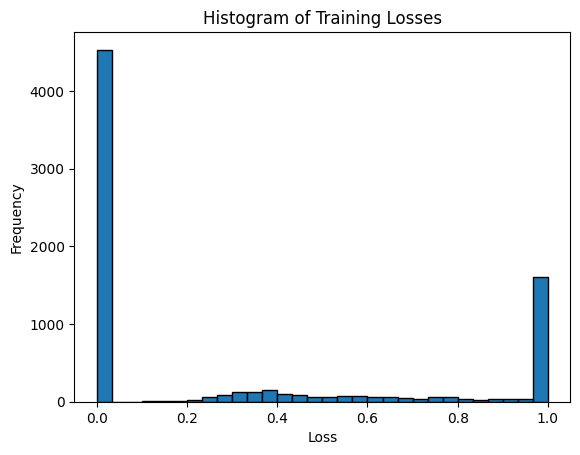

In [4]:
with torch.no_grad(): 
    for i , batch in tqdm(enumerate(train_loader)):
        inputs, targets = batch
        outputs = model(inputs)
        
        loss = dice_loss(outputs, targets)
        
        losses.append(loss.item())
        sample_indices.append(i)

# Plot histogram of losses
plt.hist(losses, bins=30, edgecolor="black")
plt.xlabel("Loss")
plt.ylabel("Frequency")
plt.title("Histogram of Training Losses")
plt.show()

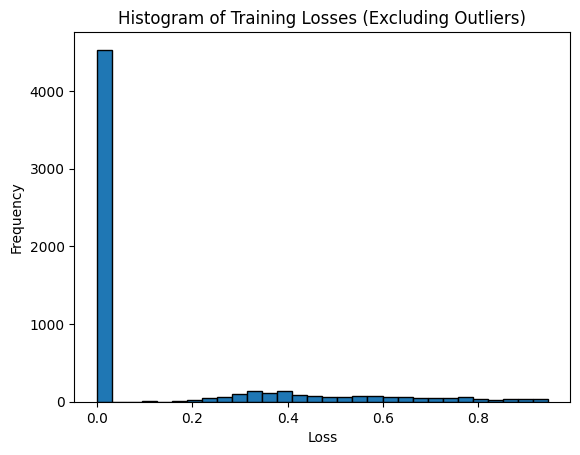

In [5]:
losses_np = np.array(losses)
lower_bound = 0
upper_bound_1 = 0.95
upper_bound_2 = 0.90
filtered_losses_95 = losses_np[(losses_np <= upper_bound_1)]
filtered_losses_90 = losses_np[(losses_np <= upper_bound_2)]

# Visualize filtered data histogram
plt.hist(filtered_losses_95, bins=30, edgecolor="black")
plt.xlabel("Loss")
plt.ylabel("Frequency")
plt.title("Histogram of Training Losses (Excluding Outliers)")
plt.show()

In [20]:
outlier_indices_95 = [idx for idx, loss in zip(sample_indices, losses_np) if  loss > upper_bound_1]
print(len(outlier_indices_95))
outlier_indices_90 = [idx for idx, loss in zip(sample_indices, losses_np) if  loss > upper_bound_2]
print(len(outlier_indices_90))
good_indices_10 = [idx for idx, loss in zip(sample_indices, losses_np) if loss < 0.1]
print(len(good_indices_10))
good_indices_90 = [idx for idx, loss in zip(sample_indices, losses_np) if loss < 0.9]
print(len(good_indices_90))

1622
1675
4529
6013


In [25]:
all_indices = set(range(len(train_loader.dataset))) 
non_outlier_indices = list(all_indices - set(outlier_indices_95))

# Save the non-outlier indices to a file
np.save("/home/sl221120/WildfireSpreadTS/non_outlier_indices.npy", non_outlier_indices)
print(f"Saved {len(non_outlier_indices)} non-outlier indices.")

Saved 6066 non-outlier indices.


In [19]:
sum_fire_pixels = 0
for idx in (outlier_indices_95):
    inputs, targets = train_loader.dataset[idx]
    sum_fire_pixels += (torch.sum(inputs[:, -1, :, :]).item())

print(f"Average percentage of fire pixels among outliers (loss>0.95) = {(sum_fire_pixels*100)/(128*128*len(outlier_indices_95))}")
    

Average percentage of fire pixels among outliers (loss>0.95) = 0.34283545102496915


In [22]:
sum_fire_pixels = 0
for idx in (outlier_indices_90):
    # Retrieve the outlier sample
    inputs, targets = train_loader.dataset[idx]
    sum_fire_pixels += (torch.sum(inputs[:, -1, :, :]).item())

print(f"Average percentage of fire pixels among outliers (loss>0.9) = {(sum_fire_pixels*100)/(128*128*len(outlier_indices_90))}")
    

Average percentage of fire pixels among outliers (loss>0.9) = 0.34151993936567165


In [42]:
sum_fire_pixels = 0
for idx in (good_indices_10):
    # Retrieve the outlier sample
    inputs, targets = train_loader.dataset[idx]
    sum_fire_pixels += (torch.sum(inputs[:, -1, :, :]).item())

print(f"Average percentage of fire pixels among <10 outliers = {(sum_fire_pixels*100)/(128*128*len(good_indices_10))}")
    

Average percentage of fire pixels among <10 outliers = 0.4255143610102948


In [23]:
sum_fire_pixels = 0
for idx in (good_indices_90):
    # Retrieve the outlier sample
    inputs, targets = train_loader.dataset[idx]
    sum_fire_pixels += (torch.sum(inputs[:, -1, :, :]).item())

print(f"Average percentage of fire pixels among <10 outliers = {(sum_fire_pixels*100)/(128*128*len(good_indices_90))}")
    

Average percentage of fire pixels among <10 outliers = 0.4403565224565525


In [31]:
labels =        {0: 'M11',
                1: 'I2',
                2: 'I1',
                3: 'NDVI',
                4: 'EVI2',
                5: 'active_fire',
                6: 'active fire'}

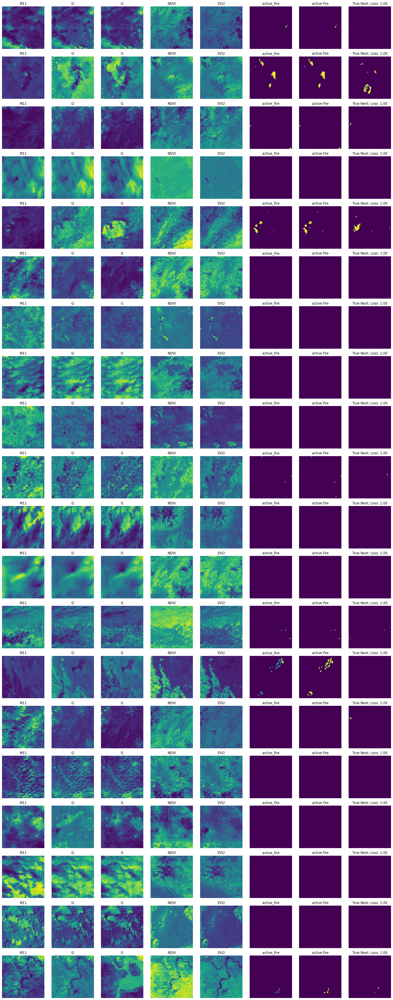

In [32]:
import random

num_samples = min(20, len(outlier_indices_95)) 

# Create a figure with subplots
fig, axes = plt.subplots(num_samples, 8, figsize=(20, 2.5 * num_samples))

random_indices = random.sample(outlier_indices_95, num_samples)

for row_idx, idx in enumerate(random_indices):
    # Retrieve the outlier sample
    inputs, targets = train_loader.dataset[idx]
    
    # Plot each of the 7 channels in the input
    for channel in range(7):
        ax = axes[row_idx, channel]
        ax.imshow(inputs[0, channel, :, :].cpu())
        ax.set_title(labels[channel])
        ax.axis("off")  # Hide axis for clarity

    # Plot the target mask as the last column
    ax = axes[row_idx, 7]
    ax.imshow(targets.cpu())
    ax.set_title(f"True Next; Loss: {losses_np[idx]:.2f}")
    ax.axis("off")  # Hide axis for clarity

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

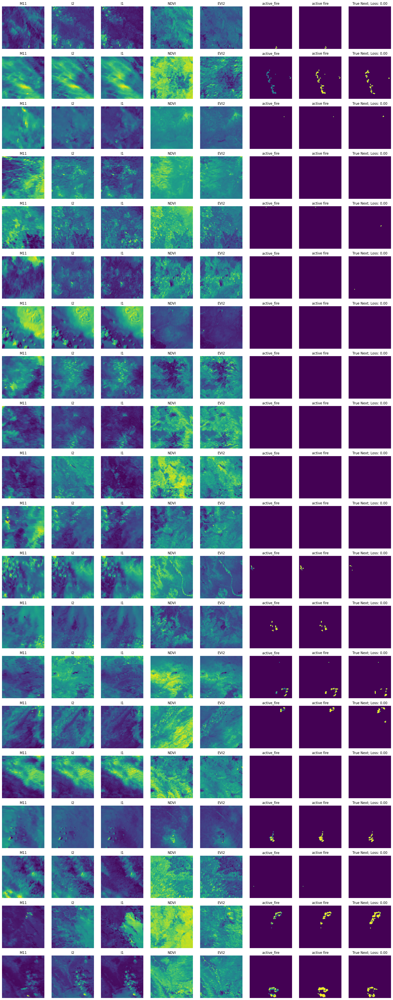

In [33]:
import random

num_samples = min(20, len(outlier_indices_95)) 

# Create a figure with subplots
fig, axes = plt.subplots(num_samples, 8, figsize=(20, 2.5 * num_samples))

random_indices = random.sample(good_indices, num_samples)

for row_idx, idx in enumerate(random_indices):
    # Retrieve the outlier sample
    inputs, targets = train_loader.dataset[idx]
    
    # Plot each of the 7 channels in the input
    for channel in range(7):
        ax = axes[row_idx, channel]
        ax.imshow(inputs[0, channel, :, :].cpu())
        ax.set_title(labels[channel])
        ax.axis("off")  # Hide axis for clarity

    # Plot the target mask as the last column
    ax = axes[row_idx, 7]
    ax.imshow(targets.cpu())
    ax.set_title(f"True Next; Loss: {losses_np[idx]:.2f}")
    ax.axis("off")  # Hide axis for clarity

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [24]:
all_indices = set(range(len(train_loader.dataset)))  # All indices in the dataset
non_outlier_indices = list(all_indices - set(outlier_indices_95))  # Exclude outliers

# Create a subset of the original dataset with only non-outlier indices
non_outlier_dataset = Subset(train_loader.dataset, non_outlier_indices)

# Use this subset for the DataLoader with the original batch size and parameters
non_outlier_loader = DataLoader(
    non_outlier_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers
)

# checkpoint_path = "./lightning_logs/wildfire_progression/ycol26xd/checkpoints/epoch=32-step=3993.ckpt"
# model = SMPModel.load_from_checkpoint(checkpoint_path)
model.train()  # Set model to train mode for finetuning


# Set up PyTorch Lightning Trainer for training
trainer = Trainer(max_epochs=10)  # Set the number of epochs as needed

# Start training with the non-outlier data
trainer.fit(model, train_dataloaders=non_outlier_loader)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/sl221120/anaconda3/envs/fire_ts/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:67: UserWarning: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
  warning_cache.warn(


RuntimeError: Lightning can't create new processes if CUDA is already initialized. Did you manually call `torch.cuda.*` functions, have moved the model to the device, or allocated memory on the GPU any other way? Please remove any such calls, or change the selected strategy. You will have to restart the Python kernel.

In [53]:
# Remove samples manually using fire percentage


# Define thresholds for fire pixel percentage
threshold_25 = 2.5 / 100
threshold_50 = 5 / 100

# Lists to store indices based on fire pixel percentage thresholds
low_fire_25_indices = []
low_fire_50_indices = []

# Loop through each sample in the training dataset
for idx, (inputs, targets) in enumerate(train_loader):
    # Calculate the percentage of fire pixels (assuming 'fire pixels' are represented as 1 in the target mask)
    fire_pixel_count = inputs[:, -1, :, :].sum().item()
    total_pixel_count = inputs[:, -1, :, :].numel()
    fire_pixel_percentage = fire_pixel_count / total_pixel_count

    # Check fire pixel percentage against thresholds
    if fire_pixel_percentage < threshold_25:
        low_fire_25_indices.append(idx)
    if fire_pixel_percentage < threshold_50:
        low_fire_50_indices.append(idx)

# Output counts for low fire pixel lists
print(f"Images with < 2.5% fire pixels: {len(low_fire_25_indices)}")
print(f"Images with < 5% fire pixels: {len(low_fire_50_indices)}")

print(f"Images with Dice loss > 0.9: {len(outlier_indices_90)}")
print(f"Images with Dice loss > 0.95: {len(outlier_indices_95)}")

# Compare these lists with the outlier indices from the loss distribution
# Assume `outlier_indices_95` and `outlier_indices_90` are already defined as per your code

# Find intersections between low fire lists and outlier lists
intersection_25_95 = set(low_fire_25_indices) & set(outlier_indices_95)
intersection_25_90 = set(low_fire_25_indices) & set(outlier_indices_90)
intersection_50_95 = set(low_fire_50_indices) & set(outlier_indices_95)
intersection_50_90 = set(low_fire_50_indices) & set(outlier_indices_90)

# Print counts of intersections
print(f"Images with < 2.5% fire pixels in outlier_indices_95: {len(intersection_25_95)}")
print(f"Images with < 2.5% fire pixels in outlier_indices_90: {len(intersection_25_90)}")
print(f"Images with < 5% fire pixels in outlier_indices_95: {len(intersection_50_95)}")
print(f"Images with < 5% fire pixels in outlier_indices_90: {len(intersection_50_90)}")

Images with < 2.5% fire pixels: 7049
Images with < 5% fire pixels: 7076
Images with Dice loss > 0.9: 1670
Images with Dice loss > 0.95: 1621
Images with < 2.5% fire pixels in outlier_indices_95: 1488
Images with < 2.5% fire pixels in outlier_indices_90: 1531
Images with < 5% fire pixels in outlier_indices_95: 1491
Images with < 5% fire pixels in outlier_indices_90: 1534
